### Stock Market Prediction And Forecasting Using Stacked LSTM

In [ ]:
### Keras and Tensorflow >2.0

In [56]:
from google.colab import drive
drive.mount('/content/drive')

import pandas as pd
df = pd.read_csv('/content/drive/MyDrive/btc_3m.csv')
df.head()
df.shape

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


(713017, 6)

In [57]:
df.head()

,datetime,open,high,low,close,volume
0,2018-01-01 05:30:00,13715.65,13715.65,13666.11,13680.00,6.303815
1,2018-01-01 05:33:00,13679.98,13679.98,13554.44,13568.00,33.709206
2,2018-01-01 05:36:00,13568.00,13575.00,13501.01,13575.00,29.645987
3,2018-01-01 05:39:00,13539.99,13575.00,13400.01,13515.26,30.696039
4,2018-01-01 05:42:00,13515.26,13568.66,13473.47,13556.15,23.260966


In [4]:
df.tail()

,datetime,open,high,low,close,volume
713012,2022-01-31 05:18:00,37919.05,37919.05,37876.94,37891.30,30.71790
713013,2022-01-31 05:21:00,37891.30,37946.56,37870.00,37918.80,28.36942
713014,2022-01-31 05:24:00,37918.79,37948.79,37888.88,37898.01,22.34601
713015,2022-01-31 05:27:00,37898.02,37945.25,37870.00,37881.76,42.83873
713016,2022-01-31 05:30:00,37881.75,37951.07,37880.00,37919.12,55.69696


In [58]:
# Set the date range
start_date = '2021-03-01'
end_date = '2021-07-30'

# Filter the da_
dfo = df[(df['datetime'] >= start_date) & (df['datetime'] <= end_date)]
print(dfo)

                   datetime      open      high       low     close  \
551930  2021-03-01 00:00:00  43581.61  43657.04  43530.01  43590.49   
551931  2021-03-01 00:03:00  43590.49  43602.81  43466.86  43523.12   
551932  2021-03-01 00:06:00  43526.41  43557.35  43311.16  43366.33   
551933  2021-03-01 00:09:00  43366.33  43460.00  43342.97  43459.99   
551934  2021-03-01 00:12:00  43460.00  43513.78  43415.26  43513.78   
...                     ...       ...       ...       ...       ...   
624231  2021-07-29 23:45:00  39642.76  39655.12  39555.00  39625.60   
624232  2021-07-29 23:48:00  39625.60  39647.55  39587.98  39591.98   
624233  2021-07-29 23:51:00  39591.99  39619.98  39570.74  39608.03   
624234  2021-07-29 23:54:00  39608.03  39615.57  39527.65  39573.98   
624235  2021-07-29 23:57:00  39573.98  39573.98  39450.00  39539.74   

            volume  
551930  110.053596  
551931  116.575453  
551932  230.187456  
551933   70.978205  
551934   47.372006  
...            ...  


In [6]:
df1=dfo.reset_index()['close']

In [7]:
df1

0        43590.49
1        43523.12
2        43366.33
3        43459.99
4        43513.78
           ...   
72301    39625.60
72302    39591.98
72303    39608.03
72304    39573.98
72305    39539.74
Name: close, Length: 72306, dtype: float64

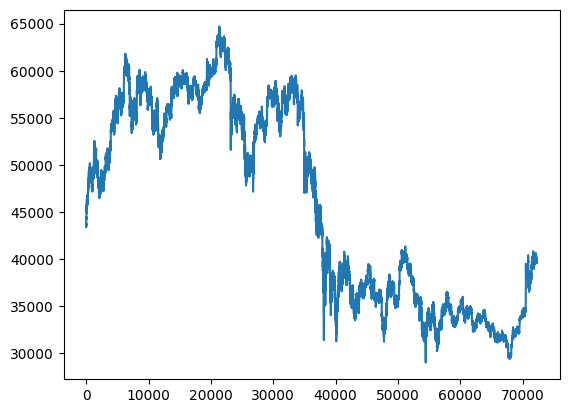

In [8]:
import matplotlib.pyplot as plt
plt.plot(df1)

In [9]:
### LSTM are sensitive to the scale of the data. so we apply MinMax scaler

In [10]:
import numpy as np

In [11]:
df1

0        43590.49
1        43523.12
2        43366.33
3        43459.99
4        43513.78
           ...   
72301    39625.60
72302    39591.98
72303    39608.03
72304    39573.98
72305    39539.74
Name: close, Length: 72306, dtype: float64

In [12]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler(feature_range=(0,1))
df1=scaler.fit_transform(np.array(df1).reshape(-1,1))

In [13]:
print(df1)

[[0.4090776 ]
 [0.40719188]
 [0.40280325]
 ...
 [0.29760653]
 [0.29665346]
 [0.29569506]]


In [14]:
##splitting dataset into train and test split
training_size=int(len(df1)*0.85)
test_size=len(df1)-training_size
train_data,test_data=df1[0:training_size,:],df1[training_size:len(df1),:1]

In [15]:
training_size,test_size

(61460, 10846)

In [16]:
train_data

array([[0.4090776 ],
       [0.40719188],
       [0.40280325],
       ...,
       [0.1523137 ],
       [0.15383414],
       [0.15220481]])

In [17]:
import numpy
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
	dataX, dataY = [], []
	for i in range(len(dataset)-time_step-1):
		a = dataset[i:(i+time_step), 0]   ###i=0, 0,1,2,3-----99   100
		dataX.append(a)
		dataY.append(dataset[i + time_step, 0])
	return numpy.array(dataX), numpy.array(dataY)

In [18]:
# reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 100
X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)

In [19]:

print(X_train.shape), print(y_train.shape)

(61359, 100)
(61359,)


(None, None)

In [20]:
print(X_test.shape), print(ytest.shape)

(10745, 100)
(10745,)


(None, None)

In [21]:
# reshape input to be [samples, time steps, features] which is required for LSTM
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

In [22]:
### Create the Stacked LSTM model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM

In [23]:
model=Sequential()
model.add(LSTM(50,return_sequences=True,input_shape=(100,1)))
model.add(LSTM(50,return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')


In [24]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 100, 50)           10400     
                                                                 
 lstm_1 (LSTM)               (None, 100, 50)           20200     
                                                                 
 lstm_2 (LSTM)               (None, 50)                20200     
                                                                 
 dense (Dense)               (None, 1)                 51        
                                                                 
Total params: 50851 (198.64 KB)
Trainable params: 50851 (198.64 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [25]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 100, 50)           10400     
                                                                 
 lstm_1 (LSTM)               (None, 100, 50)           20200     
                                                                 
 lstm_2 (LSTM)               (None, 50)                20200     
                                                                 
 dense (Dense)               (None, 1)                 51        
                                                                 
Total params: 50851 (198.64 KB)
Trainable params: 50851 (198.64 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [26]:
model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=32,batch_size=64,verbose=1)

Epoch 1/32
959/959 [==============================] - 24s 17ms/step - loss: 0.0010 - val_loss: 5.0062e-05
Epoch 2/32
959/959 [==============================] - 14s 15ms/step - loss: 6.7594e-05 - val_loss: 2.1510e-05
Epoch 3/32
959/959 [==============================] - 14s 15ms/step - loss: 6.3010e-05 - val_loss: 1.5685e-05
Epoch 4/32
959/959 [==============================] - 14s 14ms/step - loss: 5.4732e-05 - val_loss: 1.9502e-05
Epoch 5/32
959/959 [==============================] - 14s 14ms/step - loss: 4.5596e-05 - val_loss: 2.6753e-05
Epoch 6/32
959/959 [==============================] - 14s 15ms/step - loss: 3.9124e-05 - val_loss: 9.2312e-06
Epoch 7/32
959/959 [==============================] - 14s 15ms/step - loss: 3.1581e-05 - val_loss: 7.1349e-06
Epoch 8/32
959/959 [==============================] - 14s 14ms/step - loss: 2.7822e-05 - val_loss: 7.6562e-06
Epoch 9/32
959/959 [==============================] - 14s 14ms/step - loss: 2.4299e-05 - val_loss: 8.7429e-06
Epoch 10/32
95

In [27]:
import tensorflow as tf

In [39]:
import pickle
filename = 'lstm1.sav'
with open('/content/drive/My Drive/' + filename, 'wb') as f:
    pickle.dump(model, f)


In [28]:
tf.__version__

'2.15.0'

In [29]:
### Lets Do the prediction and check performance metrics
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)

336/336 [==============================] - 2s 6ms/step


In [30]:
##Transformback to original form
train_predict=scaler.inverse_transform(train_predict)
test_predict=scaler.inverse_transform(test_predict)

In [31]:
### Calculate RMSE performance metrics
import math
from sklearn.metrics import mean_squared_error
math.sqrt(mean_squared_error(y_train,train_predict))

48990.86303086658

In [32]:
### Test Data RMSE
math.sqrt(mean_squared_error(ytest,test_predict))

33746.40693906574

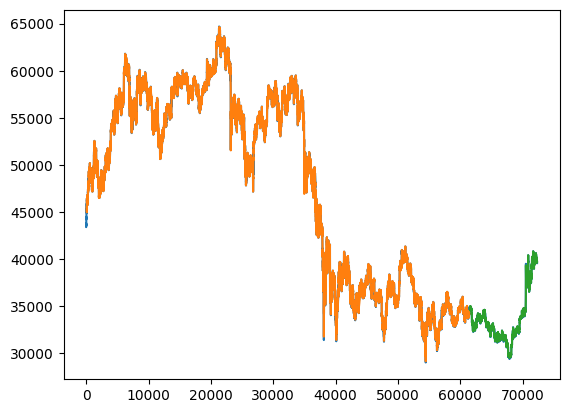

In [33]:
### Plotting
# shift train predictions for plotting
look_back=100
trainPredictPlot = numpy.empty_like(df1)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
# shift test predictions for plotting
testPredictPlot = numpy.empty_like(df1)
testPredictPlot[:, :] = numpy.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(df1)-1, :] = test_predict
# plot baseline and predictions
plt.plot(scaler.inverse_transform(df1))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()

In [34]:
len(test_data)

10846

In [35]:
x_input=test_data[341:].reshape(1,-1)
x_input.shape


(1, 10505)

In [36]:
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

In [37]:
temp_input

[0.15360909579470639,
 0.15366871557167816,
 0.15036639571857224,
 0.1497534036454834,
 0.1494421492229837,
 0.14925601236060737,
 0.14715588472390173,
 0.14439098257870941,
 0.14512433382596623,
 0.1455486698911731,
 0.1478150611312642,
 0.14735013883290804,
 0.14808349008016486,
 0.14769358233687135,
 0.14734873930762693,
 0.14623219803842546,
 0.14684854897218858,
 0.14730367459357796,
 0.14664645752160865,
 0.14566455058444183,
 0.14402038828429398,
 0.14561892606028037,
 0.14671951274127815,
 0.14721830355143528,
 0.14812939450938245,
 0.14664841685700203,
 0.1461543844328005,
 0.14567294773612793,
 0.14611463791481927,
 0.14709346589636796,
 0.14530627211249947,
 0.14472350978548076,
 0.14432072640960192,
 0.1437760311702272,
 0.14525309015182053,
 0.14329907295445388,
 0.14174643960768507,
 0.13933253840297377,
 0.1379374916028483,
 0.13840689238210413,
 0.14111217475032478,
 0.14284002866227774,
 0.14201850732231636,
 0.1407989609924314,
 0.1399933942406737,
 0.1387122687984235

In [60]:
# Set the date range
start_date = '2021-08-01'
end_date = '2021-08-30'

# Filter the da_
dfo = df[(df['datetime'] >= start_date) & (df['datetime'] <= end_date)]
print(dfo)

                   datetime      open      high       low     close     volume
625196  2021-08-01 00:00:00  41340.04  41410.00  41328.19  41407.10  40.337766
625197  2021-08-01 00:03:00  41407.06  41409.99  41325.55  41344.54  31.392633
625198  2021-08-01 00:06:00  41344.07  41401.58  41312.12  41394.82  35.711743
625199  2021-08-01 00:09:00  41394.82  41404.56  41369.85  41400.00  24.375422
625200  2021-08-01 00:12:00  41399.99  41401.33  41350.00  41366.19  24.596644
...                     ...       ...       ...       ...       ...        ...
639021  2021-08-29 23:45:00  48704.83  48708.61  48642.87  48652.25  38.103950
639022  2021-08-29 23:48:00  48651.99  48738.22  48648.95  48734.21  40.004910
639023  2021-08-29 23:51:00  48734.21  48776.80  48731.07  48736.75  46.965110
639024  2021-08-29 23:54:00  48736.76  48768.51  48731.10  48760.00  35.783640
639025  2021-08-29 23:57:00  48760.00  48845.07  48757.48  48792.76  80.812780

[13830 rows x 6 columns]


In [62]:
dfo.shape

(13830, 6)

In [63]:
result_dict = {}
for index, row in dfo.iterrows():
    timestamp = row['datetime']
    past_100_closes = dfo.loc[dfo['datetime'] < timestamp, 'close'].tail(100).tolist()
    result_dict[timestamp] = past_100_closes

# Display the result
for timestamp, closes in result_dict.items():
    print(f"{timestamp}: {closes}")

2021-08-01 00:00:00: []
2021-08-01 00:03:00: [41407.1]
2021-08-01 00:06:00: [41407.1, 41344.54]
2021-08-01 00:09:00: [41407.1, 41344.54, 41394.82]
2021-08-01 00:12:00: [41407.1, 41344.54, 41394.82, 41400.0]
2021-08-01 00:15:00: [41407.1, 41344.54, 41394.82, 41400.0, 41366.19]
2021-08-01 00:18:00: [41407.1, 41344.54, 41394.82, 41400.0, 41366.19, 41386.81]
2021-08-01 00:21:00: [41407.1, 41344.54, 41394.82, 41400.0, 41366.19, 41386.81, 41404.24]
2021-08-01 00:24:00: [41407.1, 41344.54, 41394.82, 41400.0, 41366.19, 41386.81, 41404.24, 41373.71]
2021-08-01 00:27:00: [41407.1, 41344.54, 41394.82, 41400.0, 41366.19, 41386.81, 41404.24, 41373.71, 41372.0]
2021-08-01 00:30:00: [41407.1, 41344.54, 41394.82, 41400.0, 41366.19, 41386.81, 41404.24, 41373.71, 41372.0, 41376.12]
2021-08-01 00:33:00: [41407.1, 41344.54, 41394.82, 41400.0, 41366.19, 41386.81, 41404.24, 41373.71, 41372.0, 41376.12, 41350.0]
2021-08-01 00:36:00: [41407.1, 41344.54, 41394.82, 41400.0, 41366.19, 41386.81, 41404.24, 41373.7

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2021-08-23 05:09:00: [48400.0, 48459.96, 48497.71, 48513.35, 48459.99, 48396.72, 48373.53, 48445.21, 48508.0, 48555.02, 48531.64, 48504.99, 48544.99, 48572.99, 48581.39, 48656.39, 48645.25, 48605.42, 48600.01, 48659.99, 48635.75, 48618.07, 48571.67, 48501.0, 48498.44, 48580.03, 48647.85, 48477.51, 48408.89, 48422.56, 48403.76, 48399.06, 48401.87, 48383.72, 48441.62, 48403.26, 48379.06, 48347.85, 48312.98, 48325.09, 48312.45, 48355.99, 48421.75, 48350.59, 48317.95, 48278.77, 48378.96, 48331.9, 48275.11, 48262.0, 48332.3, 48290.0, 48364.57, 48392.36, 48341.95, 48329.22, 48362.18, 48410.08, 48415.46, 48427.59, 48493.17, 48500.71, 48661.9, 48672.58, 48680.01, 48700.03, 48680.02, 48765.87, 48758.57, 48754.98, 48747.84, 48816.67, 48839.75, 48807.77, 48791.3, 48803.0, 48813.7, 48796.34, 48834.02, 48873.08, 48897.2, 48914.47, 49056.23, 49109.84, 49167.23, 49157.37, 49250.14, 49250.01, 49181.57, 49258.38, 49383.29, 49332.53, 49391.85, 49461.29, 49438.76, 49416.95, 49393.97, 49336.79, 49335.78, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [80]:
import numpy as np

# Specify the timestamp for prediction
timestamp_to_predict = '2021-08-29 05:39:00'  # Change this to your desired timestamp

# Find the index of the specified timestamp in the DataFrame
index_to_predict = df[df['datetime'] == timestamp_to_predict].index[0]

# Extract the past 100 close values as features for the specified timestamp
features = ['close']  # You can add more features if needed

x_to_predict=result_dict[timestamp_to_predict]
x_to_predict_scaled = scaler.transform(np.array(x_to_predict).reshape(-1, 1))

        # Reshape the data for the model input
x_to_predict_reshaped = np.array(x_to_predict_scaled).reshape(1, 100, len(features))

# Predict the next closing value
predicted_close_scaled = model.predict(x_to_predict_reshaped)

# Inverse transform the predicted value to the original scale
predicted_close_original_scale = scaler.inverse_transform([[predicted_close_scaled[0][0]]])[0][0]

# Extract the original close value for the specified timestamp
original_close = df.loc[df['datetime'] == timestamp_to_predict, 'close'].values[0]

# Print the prediction
print(f'Prediction for timestamp {timestamp_to_predict}: {predicted_close_original_scale}  original_close : {original_close}')


1/1 [==============================] - 0s 22ms/step
Prediction for timestamp 2021-08-29 05:39:00: 49096.579308814995  original_close : 48994.73


In [82]:
# Set the date range
start_date = '2021-08-01'
end_date = '2021-10-30'

# Filter the da_
df1 = df[(df['datetime'] >= start_date) & (df['datetime'] <= end_date)]
print(df1)

                   datetime      open      high       low     close  \
625196  2021-08-01 00:00:00  41340.04  41410.00  41328.19  41407.10   
625197  2021-08-01 00:03:00  41407.06  41409.99  41325.55  41344.54   
625198  2021-08-01 00:06:00  41344.07  41401.58  41312.12  41394.82   
625199  2021-08-01 00:09:00  41394.82  41404.56  41369.85  41400.00   
625200  2021-08-01 00:12:00  41399.99  41401.33  41350.00  41366.19   
...                     ...       ...       ...       ...       ...   
668261  2021-10-29 23:45:00  62465.00  62475.12  62380.01  62383.92   
668262  2021-10-29 23:48:00  62383.92  62399.34  62305.08  62324.92   
668263  2021-10-29 23:51:00  62324.92  62360.39  62280.01  62300.91   
668264  2021-10-29 23:54:00  62300.91  62315.88  62200.00  62200.00   
668265  2021-10-29 23:57:00  62200.01  62237.46  62148.78  62162.99   

            volume  
625196   40.337766  
625197   31.392633  
625198   35.711743  
625199   24.375422  
625200   24.596644  
...            ...  


In [83]:
result_dict = {}
for index, row in df1.iterrows():
    timestamp = row['datetime']
    past_100_closes = df1.loc[df1['datetime'] < timestamp, 'close'].tail(100).tolist()
    result_dict[timestamp] = past_100_closes

# Display the result
for timestamp, closes in result_dict.items():
    print(f"{timestamp}: {closes}")

2021-08-01 00:00:00: []
2021-08-01 00:03:00: [41407.1]
2021-08-01 00:06:00: [41407.1, 41344.54]
2021-08-01 00:09:00: [41407.1, 41344.54, 41394.82]
2021-08-01 00:12:00: [41407.1, 41344.54, 41394.82, 41400.0]
2021-08-01 00:15:00: [41407.1, 41344.54, 41394.82, 41400.0, 41366.19]
2021-08-01 00:18:00: [41407.1, 41344.54, 41394.82, 41400.0, 41366.19, 41386.81]
2021-08-01 00:21:00: [41407.1, 41344.54, 41394.82, 41400.0, 41366.19, 41386.81, 41404.24]
2021-08-01 00:24:00: [41407.1, 41344.54, 41394.82, 41400.0, 41366.19, 41386.81, 41404.24, 41373.71]
2021-08-01 00:27:00: [41407.1, 41344.54, 41394.82, 41400.0, 41366.19, 41386.81, 41404.24, 41373.71, 41372.0]
2021-08-01 00:30:00: [41407.1, 41344.54, 41394.82, 41400.0, 41366.19, 41386.81, 41404.24, 41373.71, 41372.0, 41376.12]
2021-08-01 00:33:00: [41407.1, 41344.54, 41394.82, 41400.0, 41366.19, 41386.81, 41404.24, 41373.71, 41372.0, 41376.12, 41350.0]
2021-08-01 00:36:00: [41407.1, 41344.54, 41394.82, 41400.0, 41366.19, 41386.81, 41404.24, 41373.7

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




2021-08-09 03:42:00: [43597.51, 43648.79, 43758.61, 43762.06, 43719.54, 43763.05, 43886.44, 43794.01, 43836.79, 43847.99, 43863.91, 43818.23, 43757.36, 43814.09, 43729.99, 43674.82, 43603.1, 43657.48, 43717.52, 43750.01, 43680.16, 43771.41, 43733.63, 43612.48, 43705.6, 43793.38, 43880.02, 43801.55, 43767.3, 43720.63, 43668.9, 43771.92, 43745.44, 43668.53, 43551.46, 43627.13, 43602.44, 43553.48, 43512.34, 43392.0, 43337.42, 43338.37, 43457.58, 43433.17, 43616.88, 43778.24, 43746.78, 43824.99, 43762.51, 43712.88, 43676.17, 43490.39, 43507.46, 43519.33, 43686.21, 43715.1, 43602.43, 43578.41, 43733.3, 43826.83, 43914.12, 44218.37, 44095.84, 44055.8, 43872.27, 43906.96, 43841.89, 43798.6, 43750.01, 43719.35, 43738.6, 43668.41, 43851.03, 43976.59, 43830.0, 43840.91, 43952.09, 43919.82, 43877.99, 43778.99, 43905.7, 43936.77, 43904.0, 43940.09, 44038.77, 44138.28, 44057.0, 44050.0, 44134.01, 44091.91, 44188.59, 44067.72, 44113.47, 44141.0, 44169.71, 44229.2, 44236.33, 44297.75, 44361.25, 4442

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




2021-08-31 04:06:00: [48094.47, 48106.14, 48124.61, 48129.52, 48127.23, 48127.26, 48237.64, 48313.27, 48385.01, 48291.33, 48324.18, 48237.87, 48251.6, 48244.62, 48193.06, 48179.67, 48218.47, 48242.8, 48318.34, 48251.23, 48308.42, 48347.99, 48317.52, 48361.43, 48405.37, 48427.91, 48464.0, 48496.98, 48525.0, 48486.92, 48460.55, 48470.23, 48443.0, 48432.23, 48421.37, 48450.93, 48450.75, 48447.23, 48490.02, 48463.06, 48424.84, 48468.55, 48486.02, 48489.21, 48517.64, 48545.22, 48572.67, 48619.99, 48621.03, 48561.09, 48541.26, 48644.86, 48668.49, 48628.41, 48657.77, 48625.0, 48586.2, 48570.19, 48600.12, 48571.29, 48567.01, 48600.69, 48646.93, 48610.39, 48581.15, 48611.07, 48639.35, 48622.07, 48624.92, 48607.37, 48460.32, 48414.49, 48472.47, 48501.72, 48354.41, 48387.59, 48265.4, 48217.1, 48286.21, 48303.85, 48375.32, 48385.0, 48396.3, 48426.0, 48391.22, 48360.0, 48404.99, 48391.72, 48447.08, 48354.25, 48300.0, 48279.35, 48169.85, 48240.73, 48070.96, 47860.6, 47810.02, 47798.43, 47844.27, 47

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




2021-09-10 10:57:00: [46480.01, 46522.4, 46522.0, 46519.85, 46541.73, 46609.04, 46668.29, 46685.04, 46632.52, 46610.7, 46577.3, 46621.37, 46608.82, 46601.2, 46621.99, 46585.61, 46640.32, 46676.89, 46730.78, 46732.79, 46768.64, 46747.84, 46857.0, 46949.99, 46998.85, 46949.77, 46982.61, 46890.51, 46933.17, 46920.0, 46894.74, 46849.99, 46835.83, 46858.01, 46838.72, 46815.66, 46826.4, 46778.3, 46811.3, 46858.37, 46907.87, 46913.6, 46851.58, 46801.72, 46835.16, 46798.94, 46715.69, 46750.2, 46738.16, 46734.85, 46677.56, 46699.94, 46721.05, 46593.93, 46565.89, 46539.97, 46525.59, 46568.96, 46629.12, 46573.19, 46610.0, 46630.0, 46633.22, 46666.4, 46616.85, 46624.71, 46587.27, 46607.75, 46598.14, 46645.35, 46719.71, 46766.38, 46677.32, 46699.95, 46730.03, 46710.08, 46675.5, 46799.8, 46773.66, 46746.53, 46770.01, 46795.05, 46793.35, 46760.33, 46801.44, 46717.55, 46680.94, 46657.68, 46671.73, 46610.01, 46564.66, 46378.52, 46351.01, 46369.26, 46354.01, 46636.81, 46589.48, 46496.13, 46515.51, 4650

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2021-09-20 02:27:00: [47646.72, 47626.17, 47493.71, 47606.11, 47668.07, 47650.01, 47689.36, 47704.31, 47697.13, 47608.02, 47605.81, 47622.88, 47631.89, 47680.86, 47645.51, 47519.53, 47602.73, 47603.69, 47594.53, 47565.01, 47544.91, 47586.31, 47610.01, 47617.51, 47557.43, 47580.68, 47624.88, 47625.48, 47631.72, 47602.08, 47502.54, 47380.19, 47417.97, 47397.58, 47386.71, 47333.33, 47373.12, 47293.23, 47355.35, 47391.37, 47359.99, 47390.99, 47316.47, 47400.01, 47420.6, 47440.78, 47412.67, 47393.56, 47431.99, 47538.69, 47554.18, 47746.91, 47758.84, 47755.87, 47708.95, 47672.25, 47650.43, 47600.77, 47644.32, 47662.62, 47659.39, 47721.88, 47682.47, 47696.77, 47678.45, 47665.0, 47657.13, 47556.61, 47599.92, 47598.21, 47568.84, 47610.27, 47604.35, 47551.01, 47525.04, 47554.02, 47561.08, 47469.44, 47459.26, 47376.5, 47376.72, 47308.42, 47324.14, 47422.94, 47380.02, 47389.36, 47417.4, 47420.23, 47493.18, 47479.85, 47462.7, 47462.6, 47483.49, 47522.53, 47521.81, 47524.29, 47491.91, 47577.39, 4758

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2021-09-25 09:57:00: [42878.68, 42760.66, 42717.06, 42644.52, 42724.19, 42591.22, 42691.45, 42691.66, 42757.67, 42766.98, 42810.57, 42812.49, 42604.47, 42794.8, 42654.57, 42711.73, 42811.34, 42795.98, 42858.93, 42919.16, 42692.3, 42769.84, 42715.45, 42605.26, 42692.55, 42621.0, 42624.47, 42632.83, 42663.39, 42728.72, 42727.89, 42682.85, 42647.16, 42569.98, 42409.24, 42432.71, 42487.02, 42372.78, 42231.86, 42200.67, 42142.05, 42162.6, 42265.45, 42171.32, 42259.97, 42191.95, 42312.55, 42334.7, 42394.44, 42410.14, 42392.91, 42484.52, 42466.47, 42381.55, 42420.59, 42412.45, 42523.49, 42505.91, 42493.09, 42533.28, 42510.1, 42618.53, 42724.54, 42602.32, 42573.7, 42598.7, 42487.71, 42453.87, 42362.65, 42387.74, 42336.36, 42381.97, 42434.65, 42426.65, 42385.21, 42370.33, 42456.49, 42528.1, 42642.59, 42542.25, 42556.55, 42603.43, 42679.33, 42674.37, 42711.59, 42694.98, 42616.15, 42647.04, 42645.67, 42644.8, 42608.11, 42792.33, 42740.76, 42790.17, 42718.0, 42690.01, 42764.49, 42794.5, 42827.03, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2021-10-06 06:57:00: [51340.38, 51272.9, 51265.69, 51429.32, 51404.87, 51390.05, 51272.32, 51333.21, 51309.5, 51361.54, 51462.29, 51395.46, 51424.99, 51377.86, 51342.29, 51417.55, 51479.06, 51580.05, 51609.54, 51608.33, 51716.21, 51648.93, 51708.29, 51770.0, 51842.03, 51694.12, 51656.93, 51609.99, 51608.47, 51642.81, 51718.61, 51685.69, 51604.74, 51578.86, 51509.15, 51426.51, 51386.38, 51388.99, 51381.08, 51395.77, 51407.59, 51441.29, 51409.76, 51441.79, 51479.2, 51454.47, 51344.98, 51400.0, 51404.58, 51404.27, 51349.86, 51401.3, 51403.52, 51372.89, 51431.13, 51432.56, 51459.98, 51422.75, 51589.08, 51570.01, 51478.49, 51515.23, 51582.06, 51589.39, 51593.77, 51580.58, 51565.91, 51529.07, 51545.18, 51527.6, 51471.99, 51282.52, 51308.66, 51210.14, 51371.21, 51349.99, 51486.5, 51317.76, 51269.96, 51304.46, 51247.99, 51272.45, 51253.34, 51273.72, 51274.62, 51317.28, 51321.02, 51332.32, 51271.26, 51253.34, 51321.61, 51253.19, 51170.01, 51087.73, 51046.13, 51119.1, 51230.98, 51184.0, 51088.12

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




2021-10-17 17:27:00: [60671.98, 60692.47, 60679.43, 60661.47, 60711.26, 60741.1, 60783.55, 60784.11, 60776.98, 60814.05, 60786.94, 60679.01, 60669.99, 60622.0, 60637.21, 60658.0, 60665.23, 60550.75, 60428.85, 60379.23, 60329.54, 60440.7, 60459.99, 60460.83, 60462.18, 60588.51, 60640.59, 60686.84, 60647.6, 60619.99, 60777.8, 60887.99, 60772.33, 60743.9, 60694.3, 60746.62, 60790.74, 60731.08, 60692.95, 60670.0, 60670.93, 60692.49, 60651.53, 60625.14, 60800.79, 60804.98, 60960.15, 60952.69, 60924.58, 60891.78, 60989.13, 60966.29, 60980.9, 61074.77, 61118.31, 61166.73, 61153.73, 61126.06, 61188.43, 61219.65, 61222.81, 61239.06, 61299.65, 61183.84, 61127.83, 61110.31, 61062.21, 61031.89, 61042.61, 61020.0, 61060.35, 61013.01, 60969.99, 61146.79, 61411.89, 61201.58, 61196.21, 61316.32, 61276.66, 61161.81, 61133.33, 61189.0, 61200.04, 61154.34, 61239.54, 61227.49, 61235.59, 61277.99, 61176.46, 61122.43, 61113.61, 61104.35, 61080.24, 61045.02, 61098.31, 61090.01, 61064.54, 61116.31, 61138.36,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2021-10-23 01:09:00: [61572.88, 61471.01, 61643.82, 61530.66, 61460.27, 61541.69, 61571.98, 61639.65, 61671.64, 61476.4, 61553.31, 61424.04, 61218.8, 61295.2, 61000.0, 60997.44, 60763.99, 60976.45, 61128.0, 61145.21, 61006.35, 61005.29, 61063.26, 60800.0, 60715.07, 60729.78, 60690.94, 60527.9, 60839.03, 60680.71, 60399.97, 60214.53, 60822.0, 60958.53, 61017.64, 61195.53, 61237.46, 61351.35, 61219.86, 61176.0, 61295.14, 61290.06, 61284.78, 61292.01, 61311.72, 61320.67, 61154.7, 61209.31, 61219.6, 61273.62, 61061.53, 61084.61, 60977.57, 60885.74, 60830.01, 60917.24, 60747.01, 60783.79, 60841.75, 60902.02, 60749.98, 60705.68, 60643.42, 60681.76, 60659.11, 60657.37, 60576.03, 60619.99, 60522.12, 60697.18, 60529.29, 60410.99, 60513.32, 60409.26, 60598.78, 60778.87, 60629.2, 60770.71, 60817.96, 60875.46, 60812.29, 60806.65, 60779.28, 60760.01, 60650.0, 60782.0, 60638.65, 60490.39, 60440.41, 60377.51, 60416.62, 60449.59, 60523.73, 60540.2, 60702.61, 60703.53, 60779.98, 60742.4, 60733.39, 6072

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [86]:
print(df1.shape)
df1=df1.iloc[101:]
print(df1.shape)

(43070, 6)
(42969, 6)


In [87]:
correct=0
wrong=0
for i in range(df1.shape[0]):

    # Get the date for the i-th row
    date = df1.iloc[i]['datetime']

    features = ['close']  # You can add more features if needed

    x_to_predict=result_dict[date]
    x_to_predict_scaled = scaler.transform(np.array(x_to_predict).reshape(-1, 1))

            # Reshape the data for the model input
    x_to_predict_reshaped = np.array(x_to_predict_scaled).reshape(1, 100, len(features))

    # Predict the next closing value
    predicted_close_scaled = model.predict(x_to_predict_reshaped)

    # Inverse transform the predicted value to the original scale
    predicted_close_original_scale = scaler.inverse_transform([[predicted_close_scaled[0][0]]])[0][0]



    # Get the data for the date
    data = df1[df1['datetime'] == date]


    # Difference between the predicted close and actual open
    open_price = data["open"].values[0]
    close_price = data["close"].values[0]
    diff_actual=close_price-open_price
    close_predicted = predicted_close_original_scale
    diff_predicted=close_predicted-open_price

    if (diff_predicted>0 and diff_actual>0) or (diff_predicted<0 and diff_actual<0):
        correct+=1
    else:
        wrong+=1
    percentage=correct/(correct+wrong)*100
    print(f'correct predictions : {correct}     wrong predictions : {wrong}  percentage   {percentage}')

1/1 [==============================] - 0s 21ms/step
correct predictions : 0     wrong predictions : 1  percentage   0.0
1/1 [==============================] - 0s 20ms/step
correct predictions : 1     wrong predictions : 1  percentage   50.0
1/1 [==============================] - 0s 20ms/step
correct predictions : 1     wrong predictions : 2  percentage   33.33333333333333
1/1 [==============================] - 0s 20ms/step
correct predictions : 1     wrong predictions : 3  percentage   25.0
1/1 [==============================] - 0s 20ms/step
correct predictions : 2     wrong predictions : 3  percentage   40.0
1/1 [==============================] - 0s 20ms/step
correct predictions : 2     wrong predictions : 4  percentage   33.33333333333333
1/1 [==============================] - 0s 19ms/step
correct predictions : 2     wrong predictions : 5  percentage   28.57142857142857
1/1 [==============================] - 0s 19ms/step
correct predictions : 2     wrong predictions : 6  percentage  

KeyboardInterrupt: 